### Library Imports

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow.keras.backend as K
import shutil, os, time, random, copy
import imageio
import h5py
from scipy.io import loadmat
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score, roc_curve, f1_score, precision_recall_curve, confusion_matrix, average_precision_score
import seaborn as sns
from skimage.transform import rotate, AffineTransform, warp, resize
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import Conv2D, Dense, MaxPool2D, GlobalAveragePooling2D, Input
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.utils import Sequence
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
!nvidia-smi

Thu Jul 30 03:49:49 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.51.05    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   33C    P8    26W / 149W |      0MiB / 11441MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

### Data Download and Extraction

In [3]:
!wget http://www.lamda.nju.edu.cn/files/miml-image-data.rar

--2020-07-30 03:49:56--  http://www.lamda.nju.edu.cn/files/miml-image-data.rar
Resolving www.lamda.nju.edu.cn (www.lamda.nju.edu.cn)... 210.28.132.67
Connecting to www.lamda.nju.edu.cn (www.lamda.nju.edu.cn)|210.28.132.67|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 25978029 (25M) [application/octet-stream]
Saving to: ‘miml-image-data.rar’

miml-image-data.rar 100%[===================>]  24.77M   158KB/s    in 2m 53s  

2020-07-30 03:52:50 (146 KB/s) - ‘miml-image-data.rar’ saved [25978029/25978029]



In [4]:
!unrar e /content/miml-image-data.rar


UNRAR 5.50 freeware      Copyright (c) 1993-2017 Alexander Roshal


Extracting from /content/miml-image-data.rar

Extracting  processed.rar                                                  1%  2%  OK 
Extracting  original.rar                                                   2%  3%  4%  5%  6%  7%  8%  9% 10% 11% 12% 13% 14% 15% 16% 17% 18% 19% 20% 21% 22% 23% 24% 25% 26% 27% 28% 29% 30% 31% 32% 33% 34% 35% 36% 37% 38% 39% 40% 41% 42% 43% 44% 45% 46% 47% 48% 49% 50% 51% 52% 53% 54% 55% 56% 57% 58% 59% 60% 61% 62% 63% 64% 65% 66% 67% 68% 69% 70% 71% 72% 73% 74% 75% 76% 77% 78% 79% 80% 81% 82% 83% 84% 85% 86% 87% 88% 89% 90%

In [5]:
!ls

miml-image-data.rar  original.rar  processed.rar  sample_data


In [6]:
!mkdir /content/original_images

In [ ]:
!unrar e original.rar /content/original_images

In [8]:
#!mv -i /content/*.jpg /content/original_images/

In [ ]:
!ls -l /content/original_images

In [10]:
!unrar e processed.rar


UNRAR 5.50 freeware      Copyright (c) 1993-2017 Alexander Roshal


Extracting from processed.rar

Extracting  miml data.mat                                                  5% 10% 15% 21% 26% 31% 36% 42% 47% 52% 57% 63% 68% 73% 79% 84% 89% 94% 99%  OK 
All OK


### Data Processing

In [11]:
proc_mat = loadmat("/content/miml data.mat")

In [12]:
class_names = []
for c in proc_mat['class_name']:
    print(c)
    class_names.append(c[0][0])

print(class_names)

[array(['desert'], dtype='<U6')]
[array(['mountains'], dtype='<U9')]
[array(['sea'], dtype='<U3')]
[array(['sunset'], dtype='<U6')]
[array(['trees'], dtype='<U5')]
['desert', 'mountains', 'sea', 'sunset', 'trees']


In [13]:
labels = copy.deepcopy(proc_mat['targets'].T)
labels[labels==-1] = 0
print(labels)

[[1 0 0 0 0]
 [1 0 0 0 0]
 [1 0 0 0 0]
 ...
 [0 0 0 0 1]
 [0 0 0 0 1]
 [0 0 0 0 1]]


In [14]:
train_df = pd.DataFrame(columns = ["filenames"]+class_names)
val_df = pd.DataFrame(columns = ["filenames"]+class_names)

In [15]:
train_df.columns

Index(['filenames', 'desert', 'mountains', 'sea', 'sunset', 'trees'], dtype='object')

In [16]:
filenames = os.listdir('/content/original_images/')

In [17]:
data_df = pd.DataFrame(columns=["filenames"]+class_names)

filenames = os.listdir("/content/original_images/")

In [19]:
data_df["filenames"] = np.array(sorted(list(map(lambda x:int(x[:-4]),np.array(filenames)))))
data_df['filenames'] = data_df['filenames'].apply(lambda x:'/content/original_images/'+str(x)+'.jpg')

In [20]:
data_df[class_names] = np.array(labels)

In [ ]:
data_df

In [22]:
data_df['powerlabel'] = data_df.apply(lambda x : 16*x["desert"]+8*x['mountains']+4*x['sea']+2*x['sunset']+1*x['trees'],axis=1)

In [23]:
data_df

,filenames,desert,mountains,sea,sunset,trees,powerlabel
0,/content/original_images/1.jpg,1,0,0,0,0,16
1,/content/original_images/2.jpg,1,0,0,0,0,16
2,/content/original_images/3.jpg,1,0,0,0,0,16
3,/content/original_images/4.jpg,1,1,0,0,0,24
4,/content/original_images/5.jpg,1,0,0,0,0,16
...,...,...,...,...,...,...,...
1995,/content/original_images/1996.jpg,0,0,0,0,1,1
1996,/content/original_images/1997.jpg,0,0,0,0,1,1
1997,/content/original_images/1998.jpg,0,0,0,0,1,1
1998,/content/original_images/1999.jpg,0,0,0,0,1,1


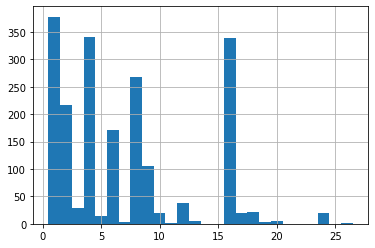

In [84]:
data_df['powerlabel'].hist(bins=np.array(range(1,np.max(np.unique(data_df['powerlabel']))+2))-0.5)

In [44]:
powercount = {}
powerlabels = np.unique(data_df['powerlabel'])
print(powerlabels)
for p in powerlabels:
    powercount[p] = np.count_nonzero(data_df['powerlabel']==p)
print(powercount)

[ 1  2  3  4  5  6  7  8  9 10 11 12 13 16 17 18 19 20 24 26]
{1: 378, 2: 216, 3: 28, 4: 341, 5: 14, 6: 172, 7: 4, 8: 268, 9: 106, 10: 19, 11: 1, 12: 38, 13: 6, 16: 340, 17: 20, 18: 21, 19: 3, 20: 5, 24: 19, 26: 1}


### Data Splitting

In [86]:
train_inds, val_inds = train_test_split(np.array(list(range(data_df.shape[0]))),test_size=0.2,random_state=7)

print(len(train_inds))

1600


In [87]:
train_df = data_df.iloc[train_inds,:].reset_index(drop=True)
train_df

,filenames,desert,mountains,sea,sunset,trees,powerlabel
0,/content/original_images/1774.jpg,0,0,0,0,1,1
1,/content/original_images/14.jpg,1,0,0,0,0,16
2,/content/original_images/390.jpg,1,0,0,0,0,16
3,/content/original_images/947.jpg,0,0,1,0,0,4
4,/content/original_images/597.jpg,0,1,0,0,0,8
...,...,...,...,...,...,...,...
1595,/content/original_images/1604.jpg,0,0,0,0,1,1
1596,/content/original_images/503.jpg,0,1,1,0,0,12
1597,/content/original_images/538.jpg,0,1,0,0,0,8
1598,/content/original_images/1221.jpg,0,0,0,1,1,3


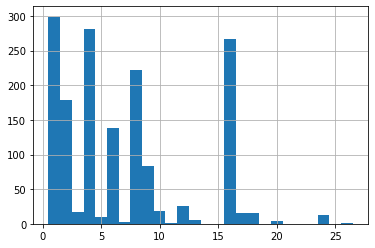

In [88]:
train_df['powerlabel'].hist(bins=np.array(range(1,np.max(np.unique(data_df['powerlabel']))+2))-0.5)

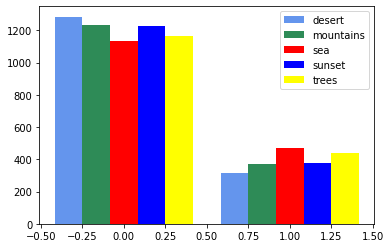

In [89]:
fig, ax = plt.subplots()

d_heights, d_bins = np.histogram(train_df['desert'],bins=[-0.5,0.5,1.5])
m_heights, m_bins = np.histogram(train_df['mountains'], bins=d_bins)
s_heights, s_bins = np.histogram(train_df['sea'], bins=m_bins)
ss_heights, ss_bins = np.histogram(train_df['sunset'], bins=s_bins)
t_heights, t_bins = np.histogram(train_df['trees'], bins=ss_bins)


width = (d_bins[1] - d_bins[0])/6.0

ax.bar(d_bins[:-1]+width, d_heights, width=width, facecolor='cornflowerblue')
ax.bar(m_bins[:-1]+width*2, m_heights, width=width, facecolor='seagreen')
ax.bar(s_bins[:-1]+width*3, s_heights, width=width, facecolor='red')
ax.bar(ss_bins[:-1]+width*4, ss_heights, width=width, facecolor='blue')
ax.bar(t_bins[:-1]+width*5, t_heights, width=width, facecolor='yellow')
ax.legend(class_names)

In [90]:
val_df = data_df.iloc[val_inds,:].reset_index(drop=True)
val_df

,filenames,desert,mountains,sea,sunset,trees,powerlabel
0,/content/original_images/1073.jpg,0,0,1,0,0,4
1,/content/original_images/1049.jpg,0,0,1,0,0,4
2,/content/original_images/205.jpg,1,0,0,0,0,16
3,/content/original_images/695.jpg,0,1,0,0,1,9
4,/content/original_images/1759.jpg,0,0,0,0,1,1
...,...,...,...,...,...,...,...
395,/content/original_images/44.jpg,1,0,0,0,0,16
396,/content/original_images/1091.jpg,0,0,1,0,0,4
397,/content/original_images/10.jpg,1,1,0,0,0,24
398,/content/original_images/1339.jpg,0,0,0,1,0,2


In [92]:
powercount = {}
powerlabels = np.unique(val_df['powerlabel'])
print(powerlabels)
for p in powerlabels:
    powercount[p] = np.count_nonzero(val_df['powerlabel']==p)
print(powercount)

[ 1  2  3  4  5  6  7  8  9 10 12 16 17 18 19 20 24]
{1: 79, 2: 37, 3: 11, 4: 60, 5: 4, 6: 33, 7: 1, 8: 46, 9: 22, 10: 1, 12: 13, 16: 73, 17: 4, 18: 5, 19: 3, 20: 1, 24: 7}


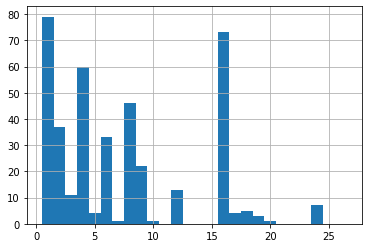

In [98]:
val_df['powerlabel'].hist(bins=np.array(range(1,np.max(np.unique(data_df['powerlabel']))+2))-0.5)

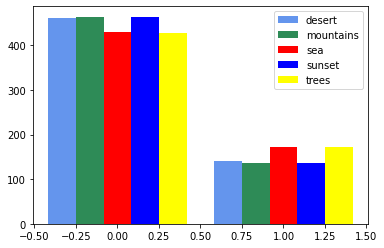

In [71]:
fig, ax = plt.subplots()

d_heights, d_bins = np.histogram(val_df['desert'],bins=[-0.5,0.5,1.5])
m_heights, m_bins = np.histogram(val_df['mountains'], bins=d_bins)
s_heights, s_bins = np.histogram(val_df['sea'], bins=m_bins)
ss_heights, ss_bins = np.histogram(val_df['sunset'], bins=s_bins)
t_heights, t_bins = np.histogram(val_df['trees'], bins=ss_bins)


width = (d_bins[1] - d_bins[0])/6.0

ax.bar(d_bins[:-1]+width, d_heights, width=width, facecolor='cornflowerblue')
ax.bar(m_bins[:-1]+width*2, m_heights, width=width, facecolor='seagreen')
ax.bar(s_bins[:-1]+width*3, s_heights, width=width, facecolor='red')
ax.bar(ss_bins[:-1]+width*4, ss_heights, width=width, facecolor='blue')
ax.bar(t_bins[:-1]+width*5, t_heights, width=width, facecolor='yellow')
ax.legend(class_names)

### Oversampling

In [93]:
powercount = {}
powerlabels = np.unique(train_df['powerlabel'])
print(powerlabels)
for p in powerlabels:
    powercount[p] = np.count_nonzero(train_df['powerlabel']==p)
print(powercount)

[ 1  2  3  4  5  6  7  8  9 10 11 12 13 16 17 18 20 24 26]
{1: 299, 2: 179, 3: 17, 4: 281, 5: 10, 6: 139, 7: 3, 8: 222, 9: 84, 10: 18, 11: 1, 12: 25, 13: 6, 16: 267, 17: 16, 18: 16, 20: 4, 24: 12, 26: 1}


#### Before oversampling

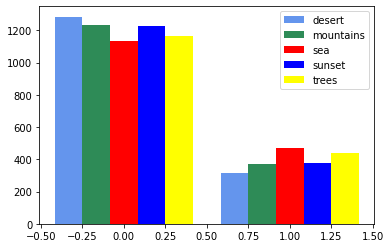

In [94]:
fig, ax = plt.subplots()

d_heights, d_bins = np.histogram(train_df['desert'],bins=[-0.5,0.5,1.5])
m_heights, m_bins = np.histogram(train_df['mountains'], bins=d_bins)
s_heights, s_bins = np.histogram(train_df['sea'], bins=m_bins)
ss_heights, ss_bins = np.histogram(train_df['sunset'], bins=s_bins)
t_heights, t_bins = np.histogram(train_df['trees'], bins=ss_bins)


width = (d_bins[1] - d_bins[0])/6.0

ax.bar(d_bins[:-1]+width, d_heights, width=width, facecolor='cornflowerblue')
ax.bar(m_bins[:-1]+width*2, m_heights, width=width, facecolor='seagreen')
ax.bar(s_bins[:-1]+width*3, s_heights, width=width, facecolor='red')
ax.bar(ss_bins[:-1]+width*4, ss_heights, width=width, facecolor='blue')
ax.bar(t_bins[:-1]+width*5, t_heights, width=width, facecolor='yellow')
ax.legend(class_names)

#### oversampling

In [95]:
maxcount = np.max(list(powercount.values()))
#print(maxcount)
for p in powerlabels:
    gapnum = maxcount - powercount[p]
    #print(gapnum)
    temp_df = train_df.iloc[np.random.choice(np.where(train_df['powerlabel']==p)[0],size=gapnum)]
    
    train_df = train_df.append(temp_df,ignore_index=True)
    #print(temp_df.shape[0],data_df.shape[0])

In [96]:
train_df = train_df.sample(frac=1).reset_index(drop=True)

In [97]:
train_df

,filenames,desert,mountains,sea,sunset,trees,powerlabel
0,/content/original_images/1520.jpg,0,0,1,1,0,6
1,/content/original_images/328.jpg,1,0,1,0,0,20
2,/content/original_images/497.jpg,0,1,1,0,0,12
3,/content/original_images/1280.jpg,0,0,1,1,1,7
4,/content/original_images/289.jpg,1,0,0,1,0,18
...,...,...,...,...,...,...,...
5676,/content/original_images/1414.jpg,0,0,0,1,0,2
5677,/content/original_images/1561.jpg,0,0,0,1,0,2
5678,/content/original_images/463.jpg,0,1,0,0,0,8
5679,/content/original_images/1539.jpg,0,0,0,1,0,2


#### After oversampling

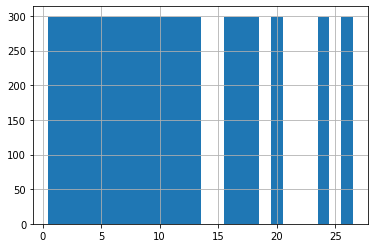

In [99]:
train_df['powerlabel'].hist(bins=np.array(range(1,np.max(np.unique(data_df['powerlabel']))+2))-0.5)

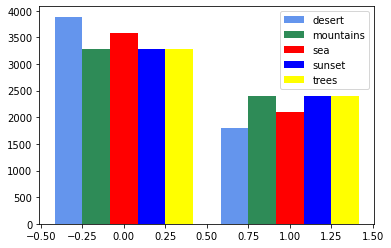

In [100]:
fig, ax = plt.subplots()

d_heights, d_bins = np.histogram(train_df['desert'],bins=[-0.5,0.5,1.5])
m_heights, m_bins = np.histogram(train_df['mountains'], bins=d_bins)
s_heights, s_bins = np.histogram(train_df['sea'], bins=m_bins)
ss_heights, ss_bins = np.histogram(train_df['sunset'], bins=s_bins)
t_heights, t_bins = np.histogram(train_df['trees'], bins=ss_bins)


width = (d_bins[1] - d_bins[0])/6.0

ax.bar(d_bins[:-1]+width, d_heights, width=width, facecolor='cornflowerblue')
ax.bar(m_bins[:-1]+width*2, m_heights, width=width, facecolor='seagreen')
ax.bar(s_bins[:-1]+width*3, s_heights, width=width, facecolor='red')
ax.bar(ss_bins[:-1]+width*4, ss_heights, width=width, facecolor='blue')
ax.bar(t_bins[:-1]+width*5, t_heights, width=width, facecolor='yellow')
ax.legend(class_names)

### Calculating the class weights

In [170]:
positive_weights = {}
negative_weights = {}
for c in class_names:
    positive_weights[c] = train_df.shape[0]/(2*np.count_nonzero(train_df[c]==1))
    negative_weights[c] = train_df.shape[0]/(2*np.count_nonzero(train_df[c]==0))
print(positive_weights)
print(negative_weights)

{'desert': 3.1666666666666665, 'mountains': 2.375, 'sea': 2.7142857142857144, 'sunset': 2.375, 'trees': 2.375}
{'desert': 1.4615384615384615, 'mountains': 1.7272727272727273, 'sea': 1.5833333333333333, 'sunset': 1.7272727272727273, 'trees': 1.7272727272727273}


In [102]:
img = imageio.imread('/content/original_images/1000.jpg')
H,W,_ = img.shape
print(H,W)

256 384


### Data Generator

In [103]:
def preprocessing_function(x):
    return (x-np.mean(x))/np.std(x)

In [104]:
class DataGeneratorKeras(Sequence):
    # Constructor
    def __init__(self,train = True, augmentation=False, preprocessing_fn = None, batch_size = 16):
        self.train = train
        self.batch_size = batch_size
        self.directory="/content/original_images"
        self.H = H
        self.W = W

        self.augmentation = augmentation
        self.preprocessing_fn = preprocessing_fn

        if self.train:
            self.all_files = train_df
        else:
            self.all_files = val_df
    
    # Get the length
    def __len__(self):
        return self.all_files.shape[0]//self.batch_size
    
    def on_epoch_end(self):
        self.all_files = self.all_files.sample(frac=1).reset_index(drop=True)
    # Getter
    def __getitem__(self, idx):
        images = np.array([],dtype=np.float32).reshape((0,self.H,self.W,3))
        labels = np.array([],dtype=np.float32).reshape((0,5))
        for i in range(self.batch_size):
            image = img_to_array(load_img(self.all_files['filenames'][idx*self.batch_size+i],target_size = (self.H,self.W)))
            y = self.all_files.iloc[idx*self.batch_size+i][class_names].values.astype(np.float32)
      
            # If there is any transform method, apply it onto the image
            if self.augmentation:
                image = rotate(image,np.random.uniform(-30,30),preserve_range=True)
                scale = np.random.uniform(1.0,1.25)
                tx = np.random.uniform(0,20)
                ty = np.random.uniform(0,20)
                image = warp(image,
                             AffineTransform(matrix=np.array([[scale, 0, tx],
                                                              [0,scale,  ty],
                                                              [0,   0,   1]])).inverse,
                             preserve_range=True)
            #RANDOM HORIZONTAL FLIPPING
            if np.random.choice([True,False]):
                image = np.flip(image,axis= 1)
            images = np.append(images,np.expand_dims(image,axis=0),axis=0)
            labels = np.append(labels,y.reshape(1,5),axis=0)
        
        if self.preprocessing_fn:
            images = self.preprocessing_fn(images)
        
        return images, labels

#### Checking the data

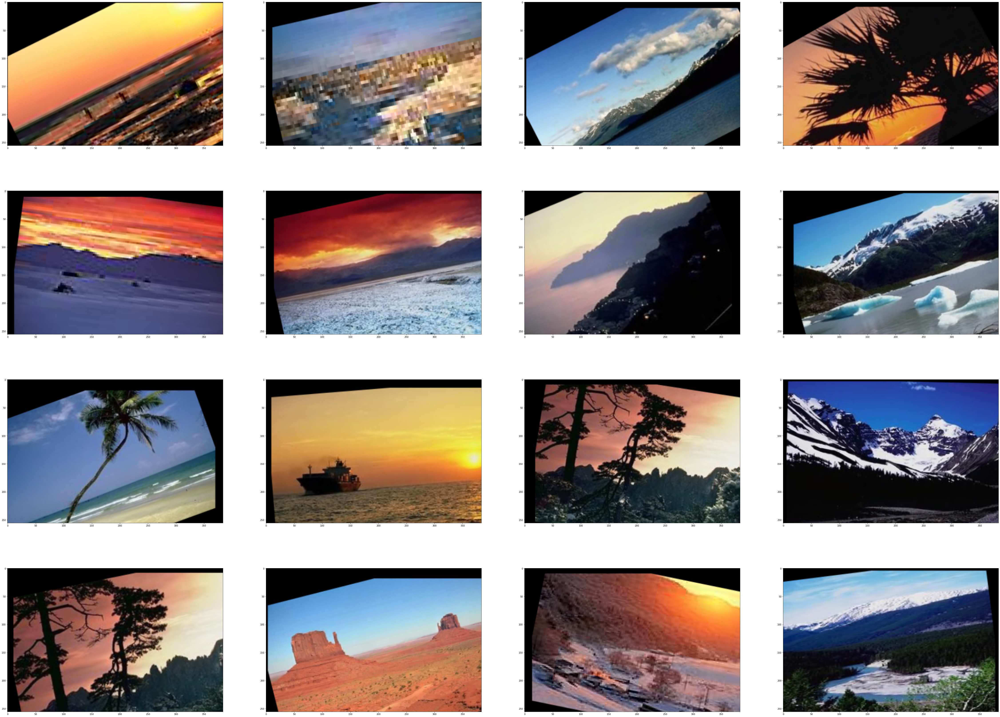

In [105]:
tdg = DataGeneratorKeras(True, True,preprocessing_function,16)
imgs,labs = tdg.__getitem__(0)
fig,axs = plt.subplots(4,4,figsize=(80,60))
for i in range(4):
    for j in range(4):
        axs[i][j].imshow((imgs[i*4+j]-np.min(imgs[i*4+j]))/(np.max(imgs[i*4+j])-np.min(imgs[i*4+j])))

In [171]:
train_datagen = DataGeneratorKeras(train = True, augmentation = True, preprocessing_fn = preprocess_input, batch_size = 32)
valid_datagen = DataGeneratorKeras(train = False, augmentation = False, preprocessing_fn = preprocess_input, batch_size = 32)

### Model

In [172]:
NUM_CLASSES = 5
fine_tuning = True

model = Sequential()

model.add(ResNet50(include_top=False,pooling='avg',weights='imagenet',input_shape=(H,W,3)))
model.add(Dense(NUM_CLASSES,activation = 'sigmoid'))

if fine_tuning:
    model.layers[0].trainable = True
else:
    model.layers[0].trainable = False

In [173]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50 (Model)             (None, 2048)              23587712  
_________________________________________________________________
dense_2 (Dense)              (None, 5)                 10245     
Total params: 23,597,957
Trainable params: 23,544,837
Non-trainable params: 53,120
_________________________________________________________________


#### Loss Function

In [174]:
def loss_fn(y_true,y_pred):
    loss = 0
    loss -= (positive_weights['desert']*y_true[0]*K.log(y_pred[0]) + negative_weights['desert']*(1-y_true[0])*K.log(1-y_pred[0]))
    loss -= (positive_weights['mountains']*y_true[1]*K.log(y_pred[1]) + negative_weights['mountains']*(1-y_true[1])*K.log(1-y_pred[1]))
    loss -= (positive_weights['sea']*y_true[2]*K.log(y_pred[2]) + negative_weights['sea']*(1-y_true[2])*K.log(1-y_pred[2]))
    loss -= (positive_weights['sunset']*y_true[3]*K.log(y_pred[3]) + negative_weights['sunset']*(1-y_true[3])*K.log(1-y_pred[3]))
    loss -= (positive_weights['trees']*y_true[4]*K.log(y_pred[4]) + negative_weights['trees']*(1-y_true[4])*K.log(1-y_pred[4]))

    return loss

#### Model compile

In [175]:
model.compile(optimizer = tf.keras.optimizers.Adam(0.00001), 
              loss = loss_fn,
              metrics = [tf.keras.metrics.BinaryAccuracy(),tf.keras.metrics.AUC()])

#### Training

In [176]:
history = model.fit(train_datagen, epochs = 10, verbose = 1, validation_data = valid_datagen, shuffle = True)

Epoch 1/10
177/177 [==============================] - 289s 2s/step - loss: 5.3358 - binary_accuracy: 0.7415 - auc_3: 0.8243 - val_loss: 4.7167 - val_binary_accuracy: 0.7427 - val_auc_3: 0.8673
Epoch 2/10
177/177 [==============================] - 286s 2s/step - loss: 3.1744 - binary_accuracy: 0.8850 - auc_3: 0.9572 - val_loss: 3.9813 - val_binary_accuracy: 0.8307 - val_auc_3: 0.9190
Epoch 3/10
177/177 [==============================] - 284s 2s/step - loss: 2.2969 - binary_accuracy: 0.9288 - auc_3: 0.9810 - val_loss: 2.5111 - val_binary_accuracy: 0.8719 - val_auc_3: 0.9441
Epoch 4/10
177/177 [==============================] - 281s 2s/step - loss: 1.6873 - binary_accuracy: 0.9481 - auc_3: 0.9888 - val_loss: 2.8929 - val_binary_accuracy: 0.8974 - val_auc_3: 0.9531
Epoch 5/10
177/177 [==============================] - 286s 2s/step - loss: 1.3912 - binary_accuracy: 0.9586 - auc_3: 0.9928 - val_loss: 2.5692 - val_binary_accuracy: 0.9036 - val_auc_3: 0.9578
Epoch 6/10
177/177 [===============

In [177]:
print(history.history.keys())

dict_keys(['loss', 'binary_accuracy', 'auc_3', 'val_loss', 'val_binary_accuracy', 'val_auc_3'])


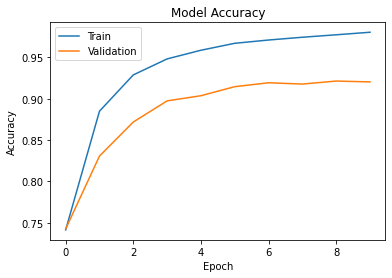

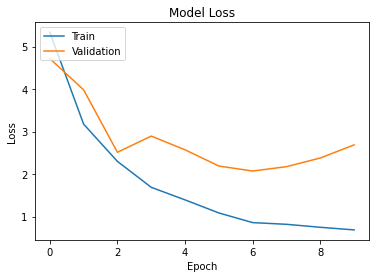

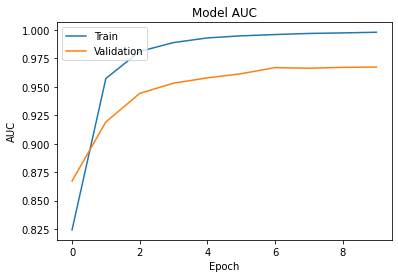

In [178]:
#  "Accuracy"
plt.plot(history.history['binary_accuracy'])
plt.plot(history.history['val_binary_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()
# "Loss"
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()
# "AUC"
plt.plot(history.history['auc_3'])
plt.plot(history.history['val_auc_3'])
plt.title('Model AUC')
plt.ylabel('AUC')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

### Performance Metrics

In [179]:
def TP(y, pred, th=0.5):
    pred_t = (pred > th)
    return np.sum((pred_t == True) & (y == 1))


def TN(y, pred, th=0.5):
    pred_t = (pred > th)
    return np.sum((pred_t == False) & (y == 0))


def FN(y, pred, th=0.5):
    pred_t = (pred > th)
    return np.sum((pred_t == False) & (y == 1))


def FP(y, pred, th=0.5):
    pred_t = (pred > th)
    return np.sum((pred_t == True) & (y == 0))

def get_accuracy(y, pred, th=0.5):
    tp = TP(y,pred,th)
    fp = FP(y,pred,th)
    tn = TN(y,pred,th)
    fn = FN(y,pred,th)
    
    return (tp+tn)/(tp+fp+tn+fn)

def get_prevalence(y):
    return np.sum(y)/y.shape[0]

def sensitivity(y, pred, th=0.5):
    tp = TP(y,pred,th)
    fn = FN(y,pred,th)
    
    return tp/(tp+fn)

def specificity(y, pred, th=0.5):
    tn = TN(y,pred,th)
    fp = FP(y,pred,th)
    
    return tn/(tn+fp)

def get_ppv(y, pred, th=0.5):
    tp = TP(y,pred,th)
    fp = FP(y,pred,th)
    
    return tp/(tp+fp)

def get_npv(y, pred, th=0.5):
    tn = TN(y,pred,th)
    fn = FN(y,pred,th)
    
    return tn/(tn+fn)


def get_performance_metrics(y, pred, class_labels, tp=TP,
                            tn=TN, fp=FP,
                            fn=FN,
                            acc=get_accuracy, prevalence=get_prevalence, 
                            spec=specificity,sens=sensitivity, ppv=get_ppv, 
                            npv=get_npv, auc=roc_auc_score, f1=f1_score,
                            thresholds=[]):
    if len(thresholds) != len(class_labels):
        thresholds = [.5] * len(class_labels)

    columns = ["", "TP", "TN", "FP", "FN", "Accuracy", "Prevalence",
               "Sensitivity",
               "Specificity", "PPV", "NPV", "AUC", "F1", "Threshold"]
    df = pd.DataFrame(columns=columns)
    for i in range(len(class_labels)):
        df.loc[i] = [""] + [0] * (len(columns) - 1)
        df.loc[i][0] = class_labels[i]
        df.loc[i][1] = round(tp(y[:, i], pred[:, i]),
                             3) if tp != None else "Not Defined"
        df.loc[i][2] = round(tn(y[:, i], pred[:, i]),
                             3) if tn != None else "Not Defined"
        df.loc[i][3] = round(fp(y[:, i], pred[:, i]),
                             3) if fp != None else "Not Defined"
        df.loc[i][4] = round(fn(y[:, i], pred[:, i]),
                             3) if fn != None else "Not Defined"
        df.loc[i][5] = round(acc(y[:, i], pred[:, i], thresholds[i]),
                             3) if acc != None else "Not Defined"
        df.loc[i][6] = round(prevalence(y[:, i]),
                             3) if prevalence != None else "Not Defined"
        df.loc[i][7] = round(sens(y[:, i], pred[:, i], thresholds[i]),
                             3) if sens != None else "Not Defined"
        df.loc[i][8] = round(spec(y[:, i], pred[:, i], thresholds[i]),
                             3) if spec != None else "Not Defined"
        df.loc[i][9] = round(ppv(y[:, i], pred[:, i], thresholds[i]),
                             3) if ppv != None else "Not Defined"
        df.loc[i][10] = round(npv(y[:, i], pred[:, i], thresholds[i]),
                              3) if npv != None else "Not Defined"
        df.loc[i][11] = round(auc(y[:, i], pred[:, i]),
                              3) if auc != None else "Not Defined"
        df.loc[i][12] = round(f1(y[:, i], pred[:, i] > thresholds[i]),
                              3) if f1 != None else "Not Defined"
        df.loc[i][13] = round(thresholds[i], 3)

    df = df.set_index("")
    return df

def bootstrap_metric(y, pred, classes, metric='auc',bootstraps = 100, fold_size = 1000):
    statistics = np.zeros((len(classes), bootstraps))
    if metric=='AUC':
        metric_func = roc_auc_score
    if metric=='Sensitivity':
        metric_func = sensitivity
    if metric=='Specificity':
        metric_func = specificity
    if metric=='Accuracy':
        metric_func = get_accuracy
    for c in range(len(classes)):
        df = pd.DataFrame(columns=['y', 'pred'])
        df.loc[:, 'y'] = y[:, c]
        df.loc[:, 'pred'] = pred[:, c]
        # get positive examples for stratified sampling
        df_pos = df[df.y == 1]
        df_neg = df[df.y == 0]
        prevalence = len(df_pos) / len(df)
        for i in range(bootstraps):
            # stratified sampling of positive and negative examples
            pos_sample = df_pos.sample(n = int(fold_size * prevalence), replace=True)
            neg_sample = df_neg.sample(n = int(fold_size * (1-prevalence)), replace=True)

            y_sample = np.concatenate([pos_sample.y.values, neg_sample.y.values])
            pred_sample = np.concatenate([pos_sample.pred.values, neg_sample.pred.values])
            score = metric_func(y_sample, pred_sample)
            statistics[c][i] = score
    return statistics

def get_confidence_intervals(y,pred,class_labels):
    
    metric_dfs = {}
    for metric in ['AUC','Sensitivity','Specificity','Accuracy']:
        statistics = bootstrap_metric(y,pred,class_labels,metric)
        df = pd.DataFrame(columns=["Mean "+metric+" (CI 5%-95%)"])
        for i in range(len(class_labels)):
            mean = statistics.mean(axis=1)[i]
            max_ = np.quantile(statistics, .95, axis=1)[i]
            min_ = np.quantile(statistics, .05, axis=1)[i]
            df.loc[class_labels[i]] = ["%.2f (%.2f-%.2f)" % (mean, min_, max_)]
        metric_dfs[metric] = df
    return metric_dfs

def get_roc_curve(gt, pred, target_names):
    fig,axs = plt.subplots(1,len(target_names),figsize=(60,10))
    for i in range(len(target_names)):
        curve_function = roc_curve
        auc_roc = roc_auc_score(gt[:, i], pred[:, i])
        label = target_names[i] + " AUC: %.3f " % auc_roc
        xlabel = "False positive rate"
        ylabel = "True positive rate"
        a, b, _ = curve_function(gt[:, i], pred[:, i])
        #plt.figure(1, figsize=(7, 7))
        axs[i].plot([0, 1], [0, 1], 'k--')
        axs[i].plot(a, b, label=label)
        axs[i].set_xlabel(xlabel)
        axs[i].set_ylabel(ylabel)
        axs[i].legend(loc='upper center',
                       fancybox=True, ncol=1)
    plt.savefig('ROC_Curve.png')
    plt.show()

def get_PR_curve(gt, pred, target_names):
    fig,axs = plt.subplots(1,len(target_names),figsize=(60,10))
    for i in range(len(target_names)):
        precision, recall, _ = precision_recall_curve(gt[:, i], pred[:, i])
        average_precision = average_precision_score(gt[:, i], pred[:, i])
        label = target_names[i] + " Avg.: %.3f " % average_precision
        #plt.figure(1, figsize=(7, 7))
        axs[i].step(recall, precision, where='post', label=label)
        axs[i].set_xlabel('Recall')
        axs[i].set_ylabel('Precision')
        axs[i].set_ylim([0.0, 1.05])
        axs[i].set_xlim([0.0, 1.0])
        axs[i].legend(loc='upper center',
                       fancybox=True, ncol=1)
    plt.savefig('Precision_and_Recall_curve.png')
    plt.show()

def plot_perf_metrics_errbars(y,pred,class_labels):
    metric_dfs = get_confidence_intervals(y,pred,class_labels)
    metrics = list(metric_dfs.keys())
    fig,axs = plt.subplots(len(metrics),1,sharey=True,figsize = (4,16))
    for i in range(len(metrics)):
        ci = metric_dfs[metrics[i]][['Mean '+metrics[i]+' (CI 5%-95%)']].values[0]
        ci_mean,ci_ints = ci[0].split(' ')
        ci_mean = float(ci_mean)
        ci_min,ci_max = list(map(float,ci_ints.strip('()').split('-')))
        ci_err = (ci_max-ci_min)/2
        
        axs[i].errorbar(class_labels,ci_mean,yerr=ci_err,capsize=5,fmt='dk')
        axs[i].set_ylabel(metrics[i])
    fig.savefig('Performance_Metrics_95percentCI.png')
    plt.show()

In [180]:
valid_datagen = DataGeneratorKeras(train = False, augmentation = False, preprocessing_fn = preprocess_input, batch_size = 1)

val_preds = np.array([]).reshape((0,5))
val_true = np.array([]).reshape((0,5))
for i in range(valid_datagen.__len__()):
    x,y = valid_datagen.__getitem__(i)
    val_true = np.append(val_true,y,axis=0)
    val_preds = np.append(val_preds,model(x).numpy().reshape((1,5)),axis=0)

In [181]:
perf_df = get_performance_metrics(val_true,val_preds,class_names)
perf_df

,TP,TN,FP,FN,Accuracy,Prevalence,Sensitivity,Specificity,PPV,NPV,AUC,F1,Threshold
,,,,,,,,,,,,,
desert,81,300,7,12,0.952,0.232,0.871,0.977,0.92,0.962,0.973,0.895,0.5
mountains,83,293,18,6,0.94,0.222,0.933,0.942,0.822,0.98,0.967,0.874,0.5
sea,76,262,26,36,0.845,0.28,0.679,0.91,0.745,0.879,0.916,0.71,0.5
sunset,85,300,9,6,0.962,0.228,0.934,0.971,0.904,0.98,0.991,0.919,0.5
trees,116,249,27,8,0.912,0.31,0.935,0.902,0.811,0.969,0.977,0.869,0.5


In [182]:
conf_df = get_confidence_intervals(val_true,val_preds,class_names)
conf_df

{'AUC':           Mean AUC (CI 5%-95%)
 desert        0.97 (0.96-0.98)
 mountains     0.97 (0.95-0.98)
 sea           0.92 (0.90-0.93)
 sunset        0.99 (0.99-1.00)
 trees         0.98 (0.97-0.98),
 'Accuracy':           Mean Accuracy (CI 5%-95%)
 desert             0.95 (0.94-0.97)
 mountains          0.94 (0.93-0.95)
 sea                0.85 (0.83-0.86)
 sunset             0.96 (0.95-0.97)
 trees              0.91 (0.90-0.93),
 'Sensitivity':           Mean Sensitivity (CI 5%-95%)
 desert                0.87 (0.84-0.91)
 mountains             0.93 (0.90-0.95)
 sea                   0.68 (0.63-0.72)
 sunset                0.94 (0.90-0.96)
 trees                 0.94 (0.91-0.96),
 'Specificity':           Mean Specificity (CI 5%-95%)
 desert                0.98 (0.97-0.99)
 mountains             0.94 (0.93-0.95)
 sea                   0.91 (0.89-0.93)
 sunset                0.97 (0.96-0.98)
 trees                 0.90 (0.88-0.92)}

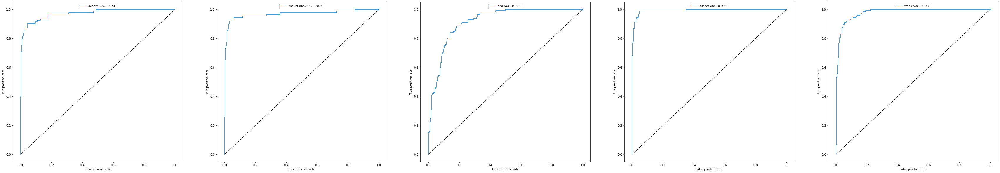

In [183]:
get_roc_curve(val_true,val_preds,class_names)

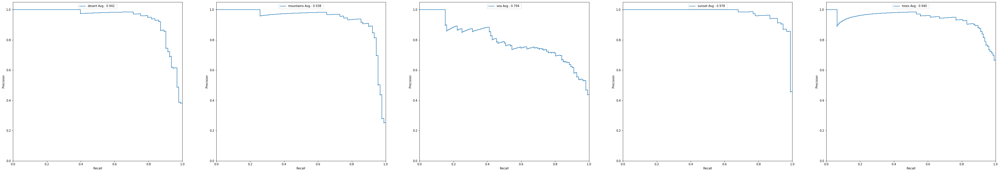

In [184]:
get_PR_curve(val_true,val_preds,class_names)

In [185]:
def plot_confusion_matrix(y_true,y_pred,class_labels):
    fig, axs = plt.subplots(1,len(class_labels),figsize=(60,10))
    for n in range(len(class_labels)):
        cm = np.zeros((2,2))
        cm[0,0] = np.sum((y_true[:,n]==1) & (y_pred[:,n]>0.5))
        cm[0,1] = np.sum((y_true[:,n]==0) & (y_pred[:,n]>0.5))
        cm[1,0] = np.sum((y_true[:,n]==1) & (y_pred[:,n]<0.5))
        cm[1,1] = np.sum((y_true[:,n]==0) & (y_pred[:,n]<0.5))
        cm_sum = np.sum(cm, axis=1, keepdims=True)
        cm_perc = cm / cm_sum.astype(float) * 100
        annot = np.empty_like(cm).astype(str)
        nrows, ncols = cm.shape
        for i in range(nrows):
            for j in range(ncols):
                c = cm[i, j]
                p = cm_perc[i, j]
                if i == j:
                    s = cm_sum[i]
                    annot[i, j] = '%.1f%%\n%d/%d' % (p, c, s)
                elif c == 0:
                    annot[i, j] = ''
                else:
                    annot[i, j] = '%.1f%%\n%d' % (p, c)
        
        class_labs = ['1','0']
        
        cm = pd.DataFrame(cm, index=class_labs, columns=class_labs)
        cm.index.name = 'Actual'
        cm.columns.name = 'Predicted'
        #fig, ax = plt.subplots(figsize=(4,4))
        axs[n].set_title('Confusion Matrix for %s'%(class_labels[n]))
        sns.heatmap(cm, cmap= "YlGnBu", annot=annot, fmt='', ax=axs[n])
        #fig.savefig('Confusion_Matrix.png')
    plt.show()

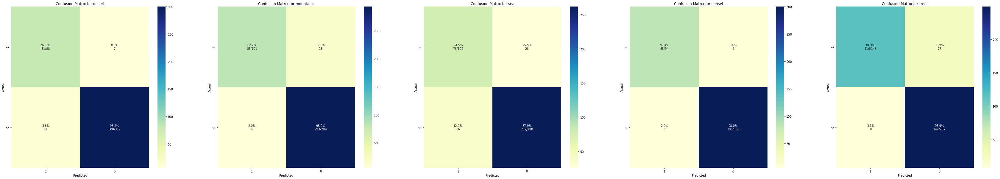

In [186]:
plot_confusion_matrix(val_true,val_preds,class_names)

#### Checking Predictions

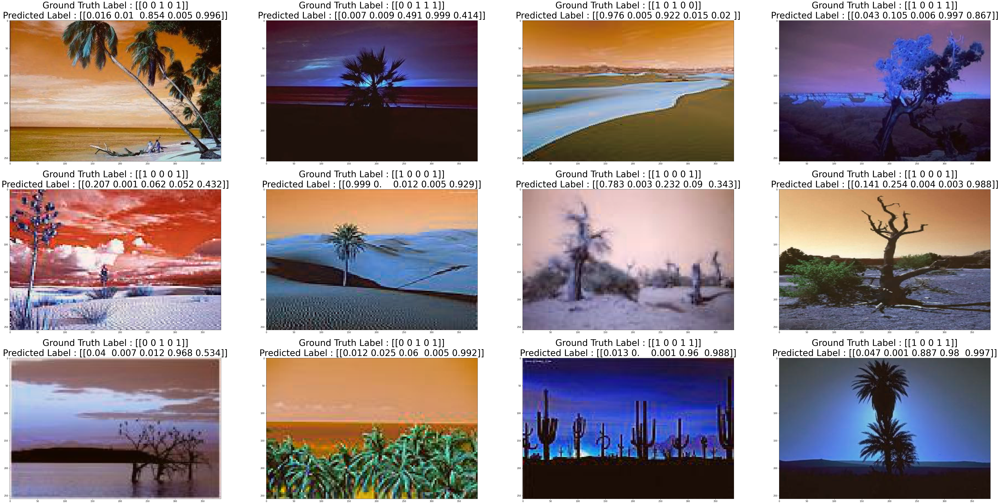

In [188]:
valid_datagen = DataGeneratorKeras(train = False, augmentation = False, preprocessing_fn = preprocess_input, batch_size = 1)

def bin2dec(l):
    num = 0
    for i in range(len(l)):
        num+=l[len(l)-i-1]*(2**i)
    return int(num)
i = 0
count = 0
fig,axs = plt.subplots(3,4,figsize=(80,40))
while(i<12):
    x,y = valid_datagen.__getitem__(count)
    if bin2dec(y[0])==5 or bin2dec(y[0])==7 or bin2dec(y[0])==17 or bin2dec(y[0])==19 or bin2dec(y[0])==20:
        pred = np.around(model(x).numpy(),3)
        y = y.astype('int')
        axs[int(i/4),i%4].imshow((x[0]-np.min(x[0]))/(np.max(x[0])-np.min(x[0])))
        axs[int(i/4),i%4].set_title("Ground Truth Label : %s\nPredicted Label : %s"%(y,pred),fontsize=40)
        i+=1
    count+=1
    